# Decoding mouse from trial syllables

In [4]:
prefix = '/home/ines/repositories/'
prefix = '/Users/ineslaranjeira/Documents/Repositories/'

In [5]:
""" 
IMPORTS
"""
import os
import numpy as np
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# --Machine learning and statistics
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler,  LabelBinarizer
from sklearn.cluster import KMeans
import random
from sklearn import mixture
import pickle
from scipy.stats import mode
from sklearn.inspection import permutation_importance

# --Machine learning and statistics
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.preprocessing import OneHotEncoder
from scipy.stats import entropy

# Get my functions
from functions import create_grouped_gradient_palette, plot_cm, plot_f1

from one.api import ONE
one = ONE(mode='remote')

## Get sequences per trial epoch

In [6]:
seq_path = prefix + 'representation_learning_variability/paper-individuality/fig1_segmentation/'
all_sequences = pd.read_parquet(seq_path+'all_sequences_09-22-2025')

In [8]:
design_df = all_sequences.pivot(index=['sample', 'trial_type', 'mouse_name'], columns=['broader_label'], values='binned_sequence').reset_index().dropna()
var_names = design_df.keys()[-4:]

In [9]:
del all_sequences

In [10]:
df = design_df.copy()
df['feedback'] = df['trial_type'].str.split().str[:1].str.join('')
df['choice'] = df['trial_type'].str.split().str[3:4].str.join('')
df['block'] = df['trial_type'].str.split().str[2:3].str.join('')
df['contrast'] = df['trial_type'].str.split().str[1:2].str.join('')
df['side'] = df['choice'].copy()
df.loc[(df['feedback']=='correct') & (df['choice']=='right'), 'side'] = 'left'
df.loc[(df['feedback']=='correct') & (df['choice']=='left'), 'side'] = 'right'

df['session'] = df['sample'].str.split().str[:1].str.join('')
df['trial_id'] = df['sample'].str.split().str[1:2].str.join('')

df['contrast'] = df['contrast'].astype(float)
df['block'] = df['block'].astype(float)

df['choice'] = df['trial_type'].str.split().str[3:4].str.join('')
df.loc[df['choice']=='left', 'choice'] = 0
df.loc[df['choice']=='right', 'choice'] = 1

df.loc[df['feedback']=='correct', 'feedback'] = 1
df.loc[df['feedback']=='incorrect', 'feedback'] = 0

## Separate states per variable (one-hot encoding)

In [13]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

sequences_choice = np.vstack(df[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]

use_states = int(max(np.unique(use_sequences)))+1
timesteps = np.shape(use_sequences)[1]
binarized = np.zeros((np.shape(use_sequences)[0], timesteps*use_states))

for t in range(timesteps):
    label_binarizer = LabelBinarizer()
    label_binarizer.fit(range(use_states))
    encoded_arr = label_binarizer.transform(use_sequences[:, t])
    binarized[:, t*use_states:(t+1)*use_states] = encoded_arr

In [14]:
final_matrix = binarized.copy()

In [15]:
np.shape(final_matrix)

(133815, 1280)

([<matplotlib.axis.XTick at 0x7fae9326cee0>,
 [Text(0, 0, '0'),
  Text(160, 0, '160'),
  Text(320, 0, '320'),
  Text(480, 0, '480'),
  Text(640, 0, '640'),
  Text(800, 0, '800'),
  Text(960, 0, '960'),
  Text(1120, 0, '1120')])

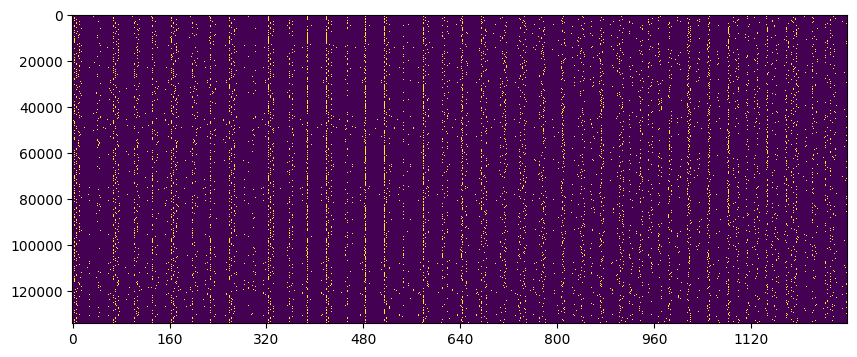

In [16]:
plt.figure(figsize=(10, 4))
plt.imshow(final_matrix, aspect='auto', cmap='viridis', interpolation='none')
plt.xticks(np.arange(0, np.shape(final_matrix)[1], 160), np.arange(0, np.shape(final_matrix)[1], 160))

# Get data of interest for decoder

In [35]:
# Pseudo-random selection of one mouse per lab
decoded_var = 'mouse_name'
var = 'fact_var'
unique_labels = len(df.mouse_name.unique())  # 70
random_mice = True
lab = 1

mat = pd.DataFrame(final_matrix)
mat['fact_var'] = pd.factorize(df[decoded_var])[0]
mat[decoded_var] = df[decoded_var]

if random_mice:
    use_labels = random.sample(list(mat['fact_var'].unique()), unique_labels)
elif lab is not None:
    # Take from specific lab
    mat['lab'] = pd.factorize(df['lab'])[0]
    use_labels = mat.loc[mat['lab']==lab, 'fact_var'].unique()[:unique_labels]
    mat = mat.drop(columns=['lab'])
else:
    # Take strictly different labs
    mat['lab'] = pd.factorize(df['lab'])[0]
    reduced_mat = mat[['lab']]
    reduced_mat = reduced_mat.drop_duplicates()
    mice_indices = reduced_mat.reset_index()['index']
    use_labels = list(mat.iloc[mice_indices]['fact_var'])[:unique_labels]  # Use only 11 labs to make sure I can control with mice from within lab
    mat = mat.drop(columns=['lab'])

named_labels = mat.loc[mat['fact_var'].isin(use_labels), decoded_var].drop_duplicates()
use_mat = mat.loc[mat['fact_var'].isin(use_labels)]
use_mat = use_mat.drop(columns=[decoded_var])
use_mat = use_mat.sort_values(by='fact_var')

## Decode mouse

In [36]:
shufflings = 1  #shuffling
# model = RandomForestClassifier(max_depth=2, random_state=0)
model = RandomForestClassifier(random_state=42)
# model = MultinomialNB()
repeats = 10

In [37]:
"""
RUN MODEL
"""

# Generate random states for each iteration with a fixed seed
# Loop over iterations of random draws of mice
# Create empty dataframes to save results
decoding_result = pd.DataFrame(columns=['shuffle', 'repeat', 'f1', 'confusion_matrix'])
dec_result = pd.DataFrame(columns=['shuffle', 'repeat', 'f1', 'confusion_matrix'])

for r in range(repeats):
    print('Repeat %d of %d' % (r+1, repeats))  
    # Decoding function with 10-fold cross validation
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    # use_mat = mat.copy() # test using all mice

    # Find minimum number of samples per label
    labels = np.array(use_mat[var])
    labels_nr = np.arange(len(use_mat[var]))
    min_freq = np.min(use_mat[var].value_counts())
    # min_freq = 400

    # Randomly select N mice from each quartile to equalize classes
    use_index = np.empty(0, dtype=int)
    for j, epoch in enumerate(np.unique(labels)):
        use_index = np.concatenate([use_index, np.random.choice(labels_nr[labels == epoch],
                                                                min_freq, replace=False)])

    new_mat = use_mat.iloc[use_index].reset_index().drop(columns=['index']).copy()
            
    # -- ORIGINAL DATASET
    y_pred = np.zeros(len(new_mat), dtype=int) 
    exog = new_mat[new_mat.columns.difference([var])]
    endog = new_mat.loc[:, var].copy()

    for train_index, test_index in kf.split(new_mat):
        model.fit(exog.iloc[train_index], endog.iloc[train_index].astype(int))
        y_pred[test_index] = model.predict(exog.iloc[test_index])

    # Calculate f1 score and confusion matrix
    f1 = f1_score(endog.astype(int), y_pred.astype('int'), average='micro')
    cm = confusion_matrix(endog.astype(int), y_pred.astype('int'), normalize='true')

    # Save results
    dec_result.loc[0, 'f1'] = f1
    dec_result.loc[0, 'confusion_matrix'] = cm
    dec_result.loc[0, 'shuffle'] = 0
    dec_result.loc[0, 'repeat'] = r

    decoding_result = pd.concat([decoding_result, dec_result])

    # -- SHUFFLED DATASET 
    shuffle_result = pd.DataFrame(columns=['shuffle', 'f1', 'confusion_matrix'])
    for s in range(shufflings):
        if np.mod(s+1, 10) == 0:
            print('Shuffling %d of %d' % (s+1, shufflings))   

        shuffle_y_pred = np.zeros(len(new_mat), dtype=int) 
        shuffle_endog = endog.copy()
        np.random.shuffle(shuffle_endog.values)

        for train_index, test_index in kf.split(new_mat):
            model.fit(exog.iloc[train_index], list(shuffle_endog.iloc[train_index].astype(int)))
            shuffle_y_pred[test_index] = model.predict(exog.iloc[test_index])   

        shuffle_f1 = f1_score(shuffle_endog.astype(int), shuffle_y_pred.astype('int'), average='micro')
        shuffle_cm = confusion_matrix(shuffle_endog.astype(int), shuffle_y_pred.astype('int'), normalize='true')

        # SAVE
        shuffle_result.loc[s, 'f1'] = shuffle_f1
        shuffle_result.loc[s, 'confusion_matrix'] = shuffle_cm
        shuffle_result.loc[s, 'shuffle'] = s + 1

    decoding_result = pd.concat([decoding_result, shuffle_result])

Repeat 1 of 10
Repeat 2 of 10
Repeat 3 of 10
Repeat 4 of 10
Repeat 5 of 10
Repeat 6 of 10
Repeat 7 of 10
Repeat 8 of 10
Repeat 9 of 10
Repeat 10 of 10


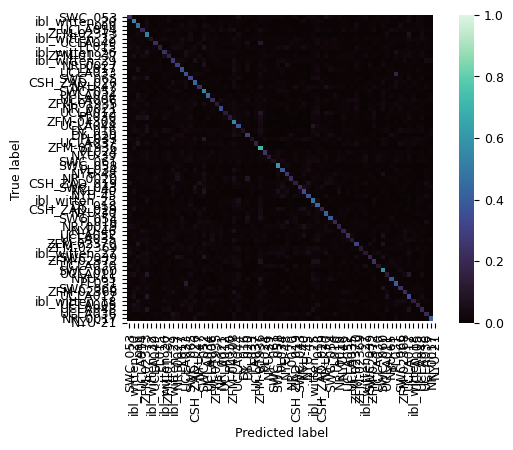

F1 results 0.2766929133858268


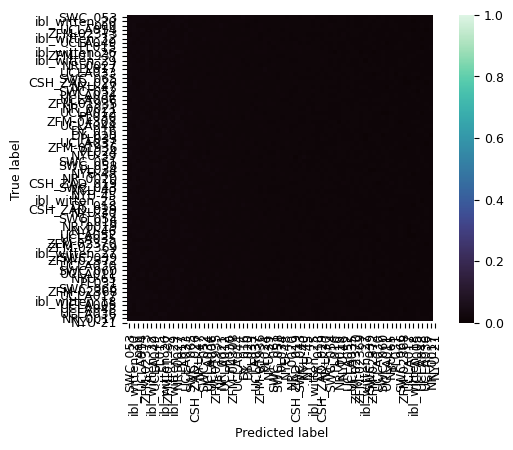

F1 shuffled results 0.013959505061867267
0    19.940701
0    21.884956
0    20.997135
0    19.013055
0    19.683377
0    16.924658
0    20.290411
0    20.530556
0    20.985591
0    18.915816
Name: f1, dtype: object


/tmp/ipykernel_13083/1589584115.py:62: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05, 1))


<Figure size 640x480 with 0 Axes>

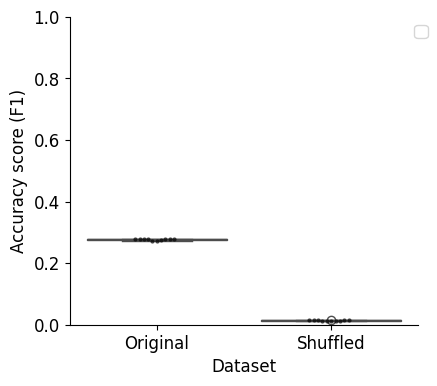

In [40]:
plot_cm(decoding_result, named_labels, [6, 4], control=True)
plot_f1(decoding_result)
decoding_ratio = decoding_result.loc[decoding_result['shuffle']==0, 'f1']/decoding_result.loc[decoding_result['shuffle']==1, 'f1']
print(decoding_ratio)

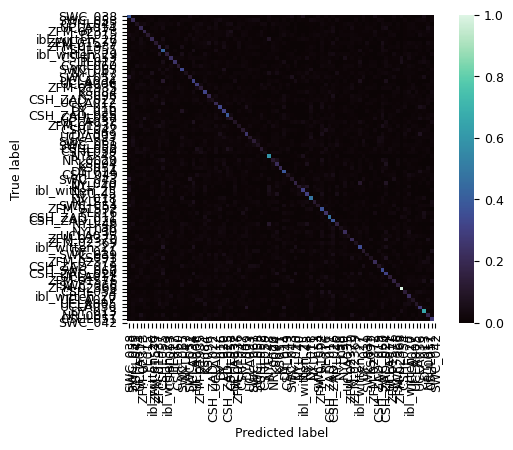

F1 results 0.21276348443439197


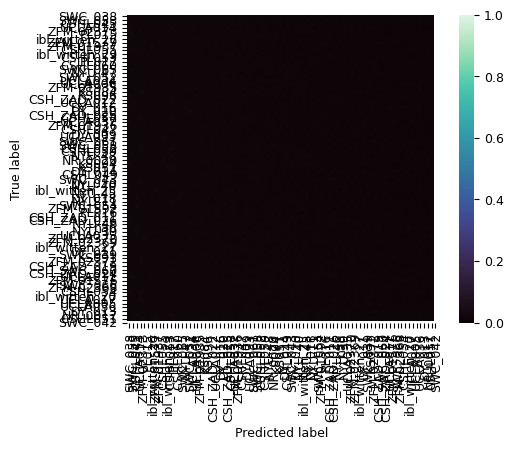

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored w

F1 shuffled results 0.01217604372820658
0    18.873973
0    16.512136
0    17.194805
0    16.935162
0     18.78273
0    17.402062
0    16.708229
0    18.524194
0    17.050633
0     17.09799
Name: f1, dtype: object


<Figure size 640x480 with 0 Axes>

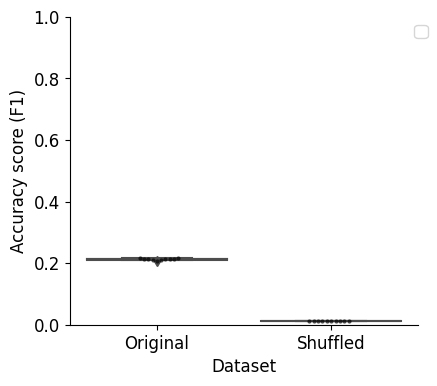

In [61]:
plot_cm(decoding_result, named_labels, [6, 4], control=True)
plot_f1(decoding_result)
decoding_ratio = decoding_result.loc[decoding_result['shuffle']==0, 'f1']/decoding_result.loc[decoding_result['shuffle']==1, 'f1']
print(decoding_ratio)

## Compute importances

In [41]:
"""
RUN MODEL
"""

shufflings = 1
# Generate random states for each iteration with a fixed seed
# Loop over iterations of random draws of mice
# Create empty dataframes to save results
decoding_result = pd.DataFrame(columns=['shuffle', 'f1', 'confusion_matrix', 'importances'], index=range(shufflings))

for s in range(shufflings):
    print('Shuffling %d of %d' % (s, shufflings))
    # if np.mod(s+1, 10) == 0:
    #     print('Shuffling %d of %d' % (s+1, shufflings))   
        
    # Decoding function with 10-fold cross validation
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    use_mat = mat.copy() # test using all mice

    # Find minimum number of samples per label
    labels = np.array(use_mat[var])
    labels_nr = np.arange(len(use_mat[var]))
    min_freq = np.min(use_mat[var].value_counts())

    # Randomly select N mice from each quartile to equalize classes
    use_index = np.empty(0, dtype=int)
    for j, epoch in enumerate(np.unique(labels)):
        use_index = np.concatenate([use_index, np.random.choice(labels_nr[labels == epoch],
                                                                min_freq, replace=False)])

    new_mat = use_mat.iloc[use_index].reset_index().drop(columns=['index']).copy()
            
    # -- ORIGINAL DATASET
    dec_result = pd.DataFrame(columns=['shuffle', 'f1', 'confusion_matrix', 'importances'])
    y_pred = np.zeros(len(new_mat), dtype=int) 
    exog = new_mat[new_mat.columns.difference([var])]
    endog = new_mat.loc[:, var].copy()

    iter_importances = np.zeros((5, np.shape(exog)[1])) * np.nan
    fold = 0
    for train_index, test_index in kf.split(new_mat):
        model.fit(exog.iloc[train_index], endog.iloc[train_index].astype(int))
        y_pred[test_index] = model.predict(exog.iloc[test_index])

        # result = permutation_importance(model, exog.iloc[test_index], y_pred[test_index], 
        #                                 n_repeats=10, random_state=42, n_jobs=2)

        # sorted_importances_idx = result.importances_mean.argsort()
        # importances = pd.DataFrame(
        #     result.importances[sorted_importances_idx].T,
        #     columns=X.columns[sorted_importances_idx],
        # )

        mdi_importances = pd.Series(model[-1].feature_importances_) 
        iter_importances[fold, :] = np.array(mdi_importances)
        fold = fold +1
        
    # Calculate f1 score and confusion matrix
    f1 = f1_score(endog.astype(int), y_pred.astype('int'), average='micro')
    cm = confusion_matrix(endog.astype(int), y_pred.astype('int'), normalize='true')

    # Save results
    dec_result.loc[0, 'f1'] = f1
    dec_result.loc[0, 'confusion_matrix'] = cm
    dec_result.loc[0, 'shuffle'] = s
    dec_result.loc[0, 'importances'] = iter_importances

    decoding_result = pd.concat([decoding_result, dec_result])

Shuffling 0 of 1


TypeError: Feature names are only supported if all input features have string names, but your input has ['int', 'str'] as feature name / column name types. If you want feature names to be stored and validated, you must convert them all to strings, by using X.columns = X.columns.astype(str) for example. Otherwise you can remove feature / column names from your input data, or convert them all to a non-string data type.

In [121]:
result = permutation_importance(model, np.array(exog.iloc[test_index]), y_pred[test_index], 
                                        n_repeats=1, random_state=42, n_jobs=1)

KeyboardInterrupt: 

In [129]:
use_states = int(max(np.unique(use_sequences)))+1
timesteps = np.shape(use_sequences)[1]
reshaped_importances = np.zeros((use_states, timesteps)) * np.nan
reshaped_importances = pd.DataFrame(columns=['syllable', 'timestep', 'importance', 'repeat'], index=range(use_states * timesteps))

for s in range(shufflings):
       for t in range(timesteps):
              mdi_importances = decoding_result.loc[decoding_result['shuffle']==s, 'importances']
              importances = np.mean(mdi_importances[0], axis=0)
              reshaped_importances['syllable'][t*use_states:(t+1)*use_states] = ['000', '100', '200', '300', '010', '110',
                     '210', '310', '001', '101', '201', '301', '011',
                     '111', '211', '311']
              reshaped_importances['timestep'][t*use_states:(t+1)*use_states] = t
              reshaped_importances['importance'][t*use_states:(t+1)*use_states] = importances[t*use_states:(t+1)*use_states]
              reshaped_importances['repeat'][t*use_states:(t+1)*use_states] = s

/tmp/ipykernel_63829/3454009758.py:9: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  reshaped_importances['syllable'][t*use_states:(t+1)*use_states] = ['000', '100', '200', '300', '010', '110',
/tmp/ipykernel_63829/3454009758.py:12: FutureWar

ValueError: cannot set using a slice indexer with a different length than the value

In [72]:
# feature_names = model[:-1].get_feature_names_out()

mdi_importances = pd.Series(
    result['importances_mean']
).sort_values(ascending=True)
ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Feature Importances (MDI)")
ax.figure.tight_layout()

NameError: name 'result' is not defined

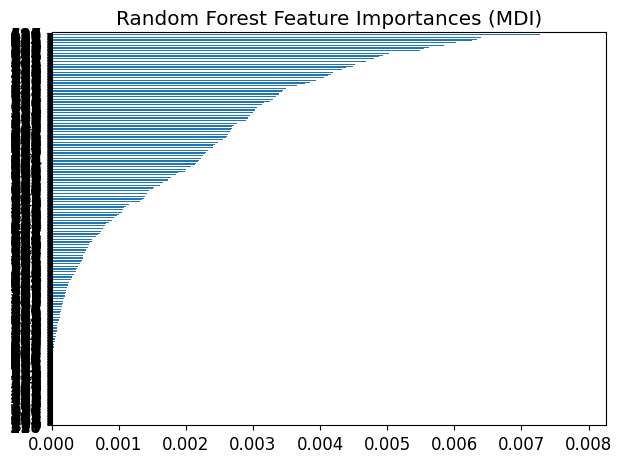

In [57]:

# feature_names = model[:-1].get_feature_names_out()

mdi_importances = pd.Series(
    model[-1].feature_importances_
).sort_values(ascending=True)

ax = mdi_importances.plot.barh()
ax.set_title("Random Forest Feature Importances (MDI)")
ax.figure.tight_layout()

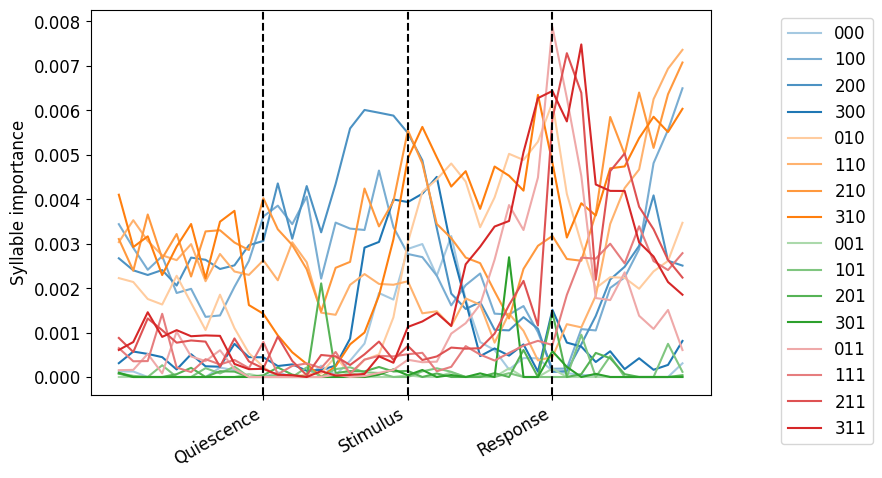

In [109]:
palette_16 = create_grouped_gradient_palette(n_groups=4, shades_per_group=4, base_palette='tab10')
palette_16_list = [palette_16(i) for i in range(palette_16.N)]  # Extract colors properly
order = ['000', '100', '200', '300', '010', '110',
           '210', '310', '001', '101', '201', '301', '011',
           '111', '211', '311']
state_to_color = dict(zip(order, palette_16_list))

fig, axs = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(8, 5))

sns.lineplot(x='timestep', y='importance', hue='syllable', data=reshaped_importances, 
             ax=axs, palette=palette_16_list)
axs.axvline(x=10, color='k', linestyle='--')
axs.axvline(x=20, color='k', linestyle='--')
axs.axvline(x=30, color='k', linestyle='--')
axs.legend(loc='upper left', bbox_to_anchor=(1.1, 1))
axs.set_ylabel('Syllable importance')
axs.set_xlabel('')
axs.set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')


## Cluster based on error 

In [96]:
trials = pd.DataFrame(use_sequences)
trials['mouse_name'] = merged_df['mouse_name']
trials['mouse_number'] = pd.factorize(merged_df['mouse_name'])[0]

In [97]:
distance_matrix = decoding_result.loc[decoding_result['shuffle'] == 0, 'confusion_matrix'].mean()

In [98]:
from scipy.spatial.distance import pdist, squareform

# Use cosine distance (1 - cosine similarity)
C_sym = (distance_matrix + distance_matrix.T) / 2
dist_matrix = squareform(pdist(C_sym, metric='cosine'))

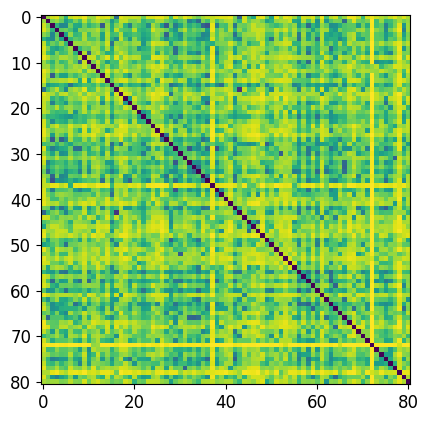

In [99]:
plt.imshow(dist_matrix)

/tmp/ipykernel_5234/3476648430.py:5: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(dist_matrix, method='average')  # You can also try 'complete', 'ward', etc.


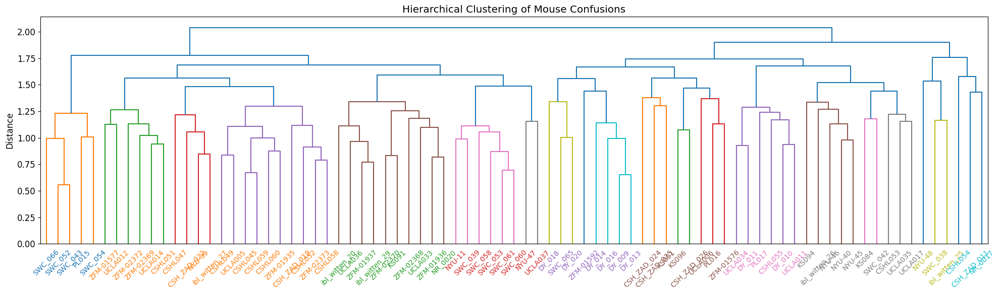

In [102]:
k = 10

from scipy.cluster.hierarchy import linkage, dendrogram
# Perform clustering
Z = linkage(dist_matrix, method='average')  # You can also try 'complete', 'ward', etc.

from scipy.cluster.hierarchy import ward, fcluster
clusters = fcluster(Z, t=k, criterion='maxclust')
clusters = clusters - 1


mouse_labels = trials['mouse_name'].unique()
# design_df['session_cluster'] = clusters 

# Plot dendrogram
fig, ax = plt.subplots(figsize=(20, 6))

# Define colors for clusters
cmap = plt.get_cmap(sns.color_palette("tab10", k, as_cmap=True))
# cmap = plt.get_cmap(sns.color_palette(k, as_cmap=True))
colors = [cmap(i % cmap.N) for i in range(k)]
cluster_colors = {i: colors[i] for i in range(k)}

# Plot dendrogram with colored labels
dendro = dendrogram(Z, labels=mouse_labels, leaf_font_size=10, ax=ax, leaf_rotation=45)

# Apply colors to tick labels
x_labels = ax.get_xmajorticklabels()
counter = 0
for lbl in x_labels:
    mouse_id = lbl.get_text()
    cluster_id = clusters[mouse_labels==mouse_id][0]
    lbl.set_color(cluster_colors[cluster_id])

plt.title("Hierarchical Clustering of Mouse Confusions")
plt.ylabel("Distance")
plt.tight_layout()

plt.show()

/tmp/ipykernel_5234/1449387188.py:5: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(dist_matrix, method='average')  # You can also try 'complete', 'ward', etc.
/home/ines/miniconda3/envs/iblenv/lib/python3.9/site-packages/scipy/cluster/hierarchy.py:834: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  return linkage(y, method='ward', metric='euclidean')


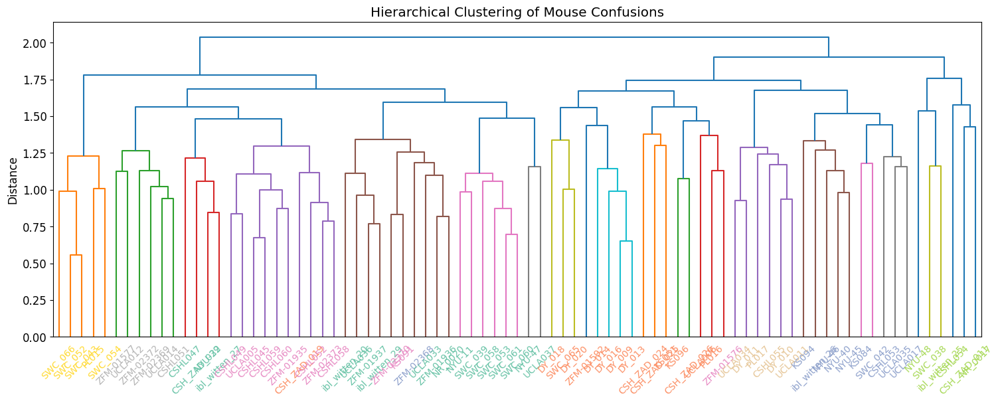

In [101]:
k = 10

from scipy.cluster.hierarchy import linkage, dendrogram
# Perform clustering
Z = linkage(dist_matrix, method='average')  # You can also try 'complete', 'ward', etc.

from sklearn.cluster import AgglomerativeClustering

clustering = AgglomerativeClustering(n_clusters=k).fit(dist_matrix)
clusters = clustering.labels_

mouse_labels = trials['mouse_name'].unique()
# design_df['session_cluster'] = clusters 

# Plot dendrogram
fig, ax = plt.subplots(figsize=(15, 6))

# Define colors for clusters
cmap = plt.get_cmap(sns.color_palette("Set2", k, as_cmap=True))
colors = [cmap(i % cmap.N) for i in range(k)]
cluster_colors = {i: colors[i] for i in range(k)}


# Plot dendrogram with colored labels
dendro = dendrogram(Z, labels=mouse_labels, leaf_font_size=10, ax=ax, leaf_rotation=45)

# Apply colors to tick labels
x_labels = ax.get_xmajorticklabels()
counter = 0
for lbl in x_labels:
    mouse_id = lbl.get_text()
    cluster_id = clusters[mouse_labels==mouse_id][0]
    lbl.set_color(cluster_colors[cluster_id])

plt.tight_layout()
plt.title("Hierarchical Clustering of Mouse Confusions")
plt.ylabel("Distance")
plt.show()


(array([ 5., 20., 10.,  8.,  8.,  8.,  6., 10.,  3.,  3.]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <BarContainer object of 10 artists>)

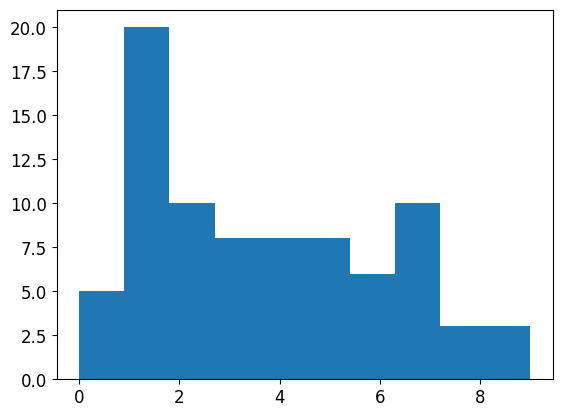

In [103]:
plt.hist(clusters)

# Visualize clusters

In [104]:
diagonal = pd.DataFrame(np.diag(decoding_result.loc[decoding_result['shuffle']==0, 'confusion_matrix'][0]))
diagonal['mouse_number'] = list(trials['mouse_number'].drop_duplicates())
diagonal = diagonal.rename(columns={0: 'accuracy'})

cluster_df = pd.DataFrame(clusters)
cluster_df['mouse_number'] = list(trials['mouse_number'].drop_duplicates())
cluster_df = cluster_df.rename(columns={0: 'mouse_cluster'})

trials = trials.merge(cluster_df, on=['mouse_number'])

In [184]:
wheel_0_mapping = {0:0, 1:1, 2:0, 3:0,
                 4:0, 5:1, 6:0, 7:0,
                 8:0, 9:1, 10:0, 11:0,
                 12:0, 13:1, 14:0, 15:0}
wheel_1_mapping = {0:0, 1:0, 2:1, 3:0,
                 4:0, 5:0, 6:1, 7:0,
                 8:0, 9:0, 10:1, 11:0,
                 12:0, 13:0, 14:1, 15:0}
wheel_2_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:0, 5:0, 6:0, 7:1,
                 8:0, 9:0, 10:0, 11:1,
                 12:0, 13:0, 14:0, 15:1}
wheel_3_mapping = {0:1, 1:0, 2:0, 3:0,
                 4:1, 5:0, 6:0, 7:0,
                 8:1, 9:0, 10:0, 11:0,
                 12:1, 13:0, 14:0, 15:0}
whisker_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:1, 5:1, 6:1, 7:1,
                 8:0, 9:0, 10:0, 11:0,
                 12:1, 13:1, 14:1, 15:1}
lick_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:0, 5:0, 6:0, 7:0,
                 8:1, 9:1, 10:1, 11:1,
                 12:1, 13:1, 14:1, 15:1}


## With error bars

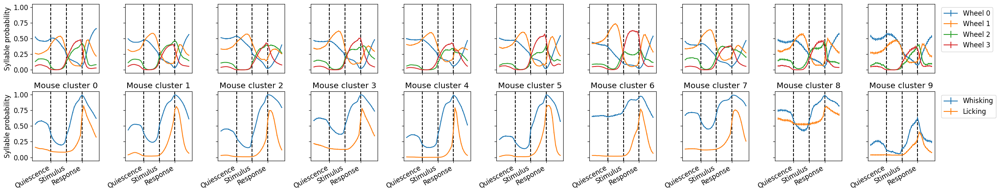

In [187]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set2", 7)
fig, axs = plt.subplots(2, np.max(clusters)+1, sharex=True, sharey=True, figsize=(25, 5))

for c, cluster in enumerate(np.arange(0, np.max(clusters)+1)):
    
    cluster_data = trials.loc[trials['mouse_cluster']==cluster]
    use_sequences = np.array(cluster_data.drop(columns=['mouse_name', 'mouse_number', 'mouse_cluster']))

    replace_whisker = np.vectorize(whisker_mapping.get)
    whisker_states = replace_whisker(use_sequences)
    replace_wheel_0 = np.vectorize(wheel_0_mapping.get)
    replace_wheel_1 = np.vectorize(wheel_1_mapping.get)
    replace_wheel_2 = np.vectorize(wheel_2_mapping.get)
    replace_wheel_3 = np.vectorize(wheel_3_mapping.get)
    wheel_state_0 = replace_wheel_0(use_sequences)    
    wheel_state_1 = replace_wheel_1(use_sequences)    
    wheel_state_2 = replace_wheel_2(use_sequences)    
    wheel_state_3 = replace_wheel_3(use_sequences)    
    replace_lick = np.vectorize(lick_mapping.get)
    lick_states = replace_lick(use_sequences)
    
    
    # Mean
    whisker_count = np.mean(whisker_states, axis=0)
    lick_count = np.mean(lick_states, axis=0)
    wheel_count_0 = np.mean(wheel_state_0, axis=0)
    wheel_count_1 = np.mean(wheel_state_1, axis=0)
    wheel_count_2 = np.mean(wheel_state_2, axis=0)
    wheel_count_3 = np.mean(wheel_state_3, axis=0)
        
    all_stacked = np.vstack([wheel_count_0, wheel_count_1, wheel_count_2, wheel_count_3,
                             whisker_count, lick_count])

    # Error
    whisker_error = np.std(whisker_states, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    lick_error = np.std(lick_states, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_0 = np.std(wheel_state_0, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_1 = np.std(wheel_state_1, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_2 = np.std(wheel_state_2, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_3 = np.std(wheel_state_3, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
        
    all_error_stacked = np.vstack([wheel_error_0, wheel_error_1, wheel_error_2, wheel_error_3, 
                                   whisker_error, lick_error])
    
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[0:1, :][0], yerr=all_error_stacked[0:1, :][0], label='Wheel 0')
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[1:2, :][0], yerr=all_error_stacked[1:2, :][0], label='Wheel 1')
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[2:3, :][0], yerr=all_error_stacked[2:3, :][0], label='Wheel 2')
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[3:4, :][0], yerr=all_error_stacked[3:4, :][0], label='Wheel 3')
      
    axs[1, c].errorbar(np.arange(0, 40, 1), all_stacked[4:5, :][0], yerr=all_error_stacked[4:5, :][0], label='Whisking')
    axs[1, c].errorbar(np.arange(0, 40, 1), all_stacked[5:6, :][0], yerr=all_error_stacked[5:6, :][0], label='Licking')

    axs[0, c].axvline(x=10, color='k', linestyle='--')
    axs[0, c].axvline(x=20, color='k', linestyle='--')
    axs[0, c].axvline(x=30, color='k', linestyle='--')
    axs[1, c].axvline(x=10, color='k', linestyle='--')
    axs[1, c].axvline(x=20, color='k', linestyle='--')
    axs[1, c].axvline(x=30, color='k', linestyle='--')

    axs[1, c].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    axs[1, c].set_title('Mouse cluster ' +str(cluster))
axs[0, c].legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[1, c].legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[0, 0].set_ylabel('Syllable probability')
axs[1, 0].set_ylabel('Syllable probability')
plt.tight_layout()
plt.show()


## Analyze entropy across trial per animal

In [ ]:
trials = pd.DataFrame(binarized)
trials['mouse_name'] = merged_df['mouse_name']
trials['mouse_number'] = pd.factorize(merged_df['mouse_name'])[0]
diagonal = pd.DataFrame(np.diag(decoding_result.loc[decoding_result['shuffle']==0, 'confusion_matrix'][0]))
diagonal['mouse_number'] = list(trials['mouse_number'].drop_duplicates())
diagonal = diagonal.rename(columns={0: 'accuracy'})
trials = trials.merge(diagonal, on=['mouse_number'])

Text(0.5, 0, 'Decoding accuracy')

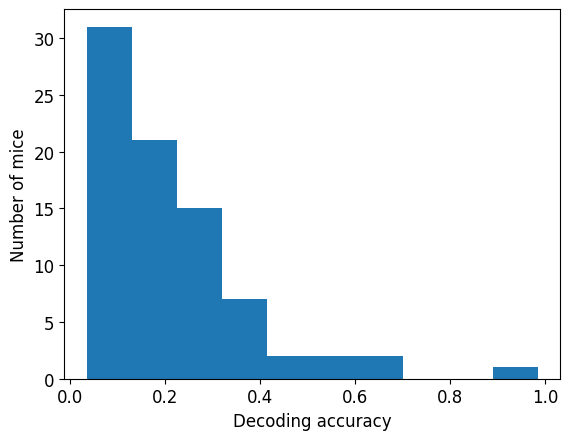

In [206]:
plt.hist(diagonal['accuracy'])
plt.ylabel('Number of mice')
plt.xlabel('Decoding accuracy')

In [186]:
entropy_df = pd.DataFrame(columns=['mouse_name',  'accuracy', 'bin', 'entropy'])

for m, mouse in enumerate(trials['mouse_name'].unique()):
    
    use_df = trials.loc[trials['mouse_name']==mouse]
    state_probs = np.mean(use_df.drop(columns=['mouse_name', 'mouse_number', 'accuracy']), axis=0)
    
    mouse_entropy = pd.DataFrame(columns=['mouse_name', 'accuracy', 'bin', 'entropy'], index=range(timesteps))
    mouse_entropy['mouse_name'] = mouse
    mouse_entropy['accuracy'] = list(use_df['accuracy'])[0]
    
    for t in range(timesteps):
        # label_binarizer = LabelBinarizer()
        # label_binarizer.fit(range(use_states))
        # encoded_arr = label_binarizer.transform(use_sequences[:, t])
        bin_data = state_probs[t*16:(t+1)*16]
        ent = entropy(bin_data)/np.log(16)
        mouse_entropy['entropy'][t] = ent
        mouse_entropy['bin'][t] = t
        
    entropy_df = pd.concat([entropy_df, mouse_entropy])
        
    

/tmp/ipykernel_19502/2226901285.py:18: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  mouse_entropy['entropy'][t] = ent
/tmp/ipykernel_19502/2226901285.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

In [210]:
entropy_df['accuracy_type'] = entropy_df['accuracy']
entropy_df.loc[entropy_df['accuracy_type']<.05, 'accuracy_type'] = 0
entropy_df.loc[entropy_df['accuracy_type']>.3, 'accuracy_type'] = 2
entropy_df.loc[(entropy_df['accuracy_type']>.05) &
               (entropy_df['accuracy_type']<.3), 'accuracy_type'] = 1



Text(0.5, 0, 'Trial events')

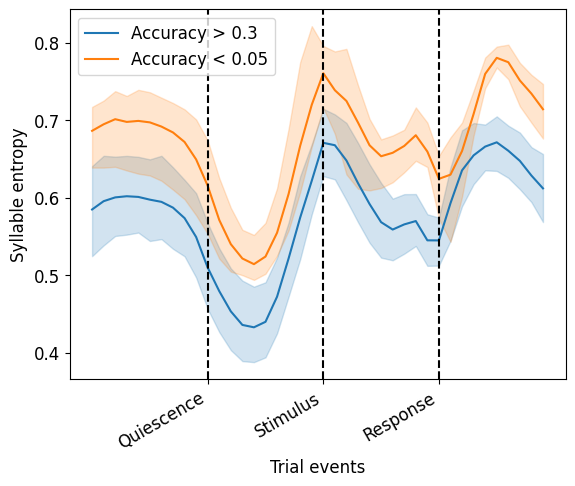

In [220]:
sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[entropy_df['accuracy']>.3], label='Accuracy > 0.3')
# sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[(entropy_df['accuracy']>.05) &
#                                                        (entropy_df['accuracy']<.3)])
sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[entropy_df['accuracy']<.05], label='Accuracy < 0.05')


plt.axvline(x=10, color='k', linestyle='--')
plt.axvline(x=20, color='k', linestyle='--')
plt.axvline(x=30, color='k', linestyle='--')

plt.xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
plt.ylabel('Syllable entropy')
plt.xlabel('Trial events')

## Vizualize results

In [216]:
wheel_mapping = {0:0, 1:1, 2:2, 3:3,
                 4:0, 5:1, 6:2, 7:3,
                 8:0, 9:1, 10:2, 11:3,
                 12:0, 13:1, 14:2, 15:3}
whisker_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:1, 5:1, 6:1, 7:1,
                 8:0, 9:0, 10:0, 11:0,
                 12:1, 13:1, 14:1, 15:1}
lick_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:0, 5:0, 6:0, 7:0,
                 8:1, 9:1, 10:1, 11:1,
                 12:1, 13:1, 14:1, 15:1}
replace_wheel = np.vectorize(wheel_mapping.get)
# wheel_states = replace_wheel(use_sequences)
replace_whisker = np.vectorize(whisker_mapping.get)
# whisker_states = replace_whisker(use_sequences)
replace_lick = np.vectorize(lick_mapping.get)

In [ ]:
# select mice with very good decoding or bad

/tmp/ipykernel_19502/2601245174.py:51: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')


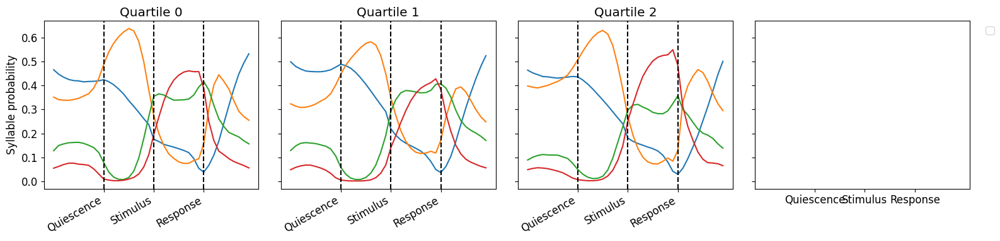

In [217]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set2", 7)
fig, axs = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(16, 4))

use_data = trial_clusters.merge(entropy_df[['mouse_name', 'accuracy_type']].drop_duplicates(), on=['mouse_name'])


for q, quartile in enumerate([0, 1, 2]):
    cluster_data = use_data.loc[use_data['accuracy_type']==quartile]
    sequences_choice = np.vstack(cluster_data[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
    use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]
    
    replace_whisker = np.vectorize(whisker_mapping.get)
    whisker_states = replace_whisker(use_sequences)
    replace_wheel = np.vectorize(wheel_mapping.get)
    wheel_states = replace_wheel(use_sequences)    
    replace_lick = np.vectorize(lick_mapping.get)
    lick_states = replace_lick(use_sequences)
    
    whisker_count = np.zeros((1, 40))
    lick_count = np.zeros((1, 40))
    wheel_count = np.zeros((4, 40))

    for b, bin in enumerate(range(40)):
        # counts, bins = np.histogram(use_sequences[:, b], range=(0,15), bins=16)
        whisker_count[0, b] = np.sum(whisker_states[:, b]==1)/len(whisker_states[:, b])
        lick_count[0, b] = np.sum(lick_states[:, b]==1)/len(lick_states[:, b])
        wheel_count[0, b] = np.sum(wheel_states[:, b]==1)/len(wheel_states[:, b])
        wheel_count[1, b] = np.sum(wheel_states[:, b]==2)/len(wheel_states[:, b])
        wheel_count[2, b] = np.sum(wheel_states[:, b]==3)/len(wheel_states[:, b])
        wheel_count[3, b] = np.sum(wheel_states[:, b]==0)/len(wheel_states[:, b])
    
    all_stacked = np.vstack([wheel_count, whisker_count, lick_count])
    # all_stacked = np.vstack([wheel_count])

    # cmap_value_1 = create_shaded_cmap(colors[q], name='cmap_value_1')
    # image = axs[c].imshow(all_stacked, cmap=cmap_value_1, aspect='auto')
    axs[q].plot(all_stacked[0:4, :].T, label=['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3'])
    # image = axs[q].imshow(all_stacked, cmap='Greys', aspect='auto')
    # fig.colorbar(image, ax=axs[q], location='right', anchor=(0, 0.3))
    # axs[q].set_yticks(np.arange(0, 6, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3', 'Whisking', 'Licking'])
    # axs[c].set_yticks(np.arange(0, 4, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3'])
    axs[q].axvline(x=10, color='k', linestyle='--')
    axs[q].axvline(x=20, color='k', linestyle='--')
    axs[q].axvline(x=30, color='k', linestyle='--')

    axs[q].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    # axs[c].set_xlabel('Time in epoch')
    axs[q].set_title('Quartile ' +str(quartile))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[0].set_ylabel('Syllable probability')
plt.tight_layout()
plt.show()

/tmp/ipykernel_19502/1841012585.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')


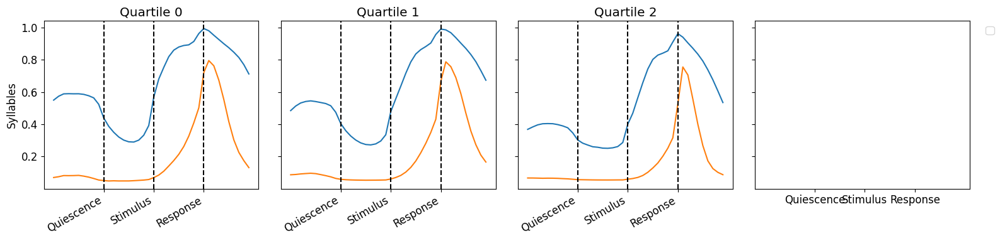

In [218]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set2", 7)
fig, axs = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(16, 4))

use_data = trial_clusters.merge(entropy_df[['mouse_name', 'accuracy_type']].drop_duplicates(), on=['mouse_name'])


for q, quartile in enumerate([0, 1, 2]):
    
    cluster_data = use_data.loc[use_data['accuracy_type']==quartile]
    sequences_choice = np.vstack(cluster_data[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
    use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]
    
    replace_whisker = np.vectorize(whisker_mapping.get)
    whisker_states = replace_whisker(use_sequences)
    replace_wheel = np.vectorize(wheel_mapping.get)
    wheel_states = replace_wheel(use_sequences)    
    replace_lick = np.vectorize(lick_mapping.get)
    lick_states = replace_lick(use_sequences)
    
    whisker_count = np.zeros((1, 40))
    lick_count = np.zeros((1, 40))
    wheel_count = np.zeros((4, 40))

    for b, bin in enumerate(range(40)):
        # counts, bins = np.histogram(use_sequences[:, b], range=(0,15), bins=16)
        whisker_count[0, b] = np.sum(whisker_states[:, b]==1)/len(whisker_states[:, b])
        lick_count[0, b] = np.sum(lick_states[:, b]==1)/len(lick_states[:, b])
        wheel_count[0, b] = np.sum(wheel_states[:, b]==1)/len(wheel_states[:, b])
        wheel_count[1, b] = np.sum(wheel_states[:, b]==2)/len(wheel_states[:, b])
        wheel_count[2, b] = np.sum(wheel_states[:, b]==3)/len(wheel_states[:, b])
        wheel_count[3, b] = np.sum(wheel_states[:, b]==0)/len(wheel_states[:, b])
    
    all_stacked = np.vstack([wheel_count, whisker_count, lick_count])
    # all_stacked = np.vstack([wheel_count])

    # cmap_value_1 = create_shaded_cmap(colors[q], name='cmap_value_1')
    # image = axs[c].imshow(all_stacked, cmap=cmap_value_1, aspect='auto')
    axs[q].plot(all_stacked[4:6, :].T, label=['Whisking', 'Licking'])
    # image = axs[q].imshow(all_stacked, cmap='Greys', aspect='auto')
    # fig.colorbar(image, ax=axs[q], location='right', anchor=(0, 0.3))
    # axs[q].set_yticks(np.arange(0, 6, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3', 'Whisking', 'Licking'])
    # axs[c].set_yticks(np.arange(0, 4, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3'])
    axs[q].axvline(x=10, color='k', linestyle='--')
    axs[q].axvline(x=20, color='k', linestyle='--')
    axs[q].axvline(x=30, color='k', linestyle='--')

    axs[q].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    # axs[c].set_xlabel('Time in epoch')
    axs[q].set_title('Quartile ' +str(quartile))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[0].set_ylabel('Syllables')
plt.tight_layout()
plt.show()